# AutoML - NLP Tweets 

![img](https://img.freepik.com/vetores-gratis/fundo-de-icones-de-midia-social-3d_52683-28863.jpg?w=740&t=st=1674068655~exp=1674069255~hmac=ce3b51a9cc74691639fd2ae3439d8d5c072410da339ac820472b6827af483286)

In [4]:
!pip install pycaret
!pip install umap-learn
!pip install --upgrade nbformat
!python -m spacy download en_core_web_sm
!python -m textblob.download_corpora

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.0/12.0 MB 71.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for en_core_web_sm: filename=en_core_web_sm-2.3.1-py3-none-any.whl size=12047104 sha256=d2d7f91630d12ee2456bf79e7b1f4cf850ac108e2c5439b8b8052d8b08b33b45
  Stored in directory: /root/.cache/pip/wheels/ee/4d/f7/563214122be1540b5f9197b52cb3ddb9c4a8070808b22d5a84
Successfully built en_core_web_sm
  Attempting uninstall: en_core_web_sm
    Found existing installation: en-core-web-sm 3.4.1
    Uninstalling en-core-web-sm-3.4.1:
      Successfully uninstalled en-core-w

In [6]:
# Imports
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Biblioteca AutoML Pycaret


# pycaret pelo colab
from pycaret.utils import enable_colab
enable_colab()

# Parâmetros de configuração dos gráficos
from matplotlib import rcParams

rcParams['figure.figsize'] = 12, 4
rcParams['lines.linewidth'] = 3
rcParams['xtick.labelsize'] = 'x-large'
rcParams['ytick.labelsize'] = 'x-large'

# Versão da Linguagem Python
from platform import python_version
print('Versão da Linguagem Python Usada Neste Jupyter Notebook:', python_version())

# Versões dos pacotes usados neste jupyter notebook
#%reload_ext watermark
#%watermark -a "Verções bibliotecas" --iversions

import warnings
warnings.filterwarnings("ignore")

Colab mode enabled.
Versão da Linguagem Python Usada Neste Jupyter Notebook: 3.8.10


# Base dados

In [7]:
# Base geral
data = pd.read_csv("https://raw.githubusercontent.com/Delta357/AutoML---Machine-learning/main/data/tweets_data.csv")
data

,Unnamed: 0,username,description,location,following,followers,totaltweets,retweetcount,text,hashtags
0,0,Discovertech3,Just a bot helping developers and designers by...,Internet,1,716,103083,40,What is #AutoML (Automated Machine Learning)? ...,"['AutoML', 'MachineLearning', 'AI', 'KI', 'Alg..."
1,1,30xcodes,Retweets 🧲 #30DaysOfCode & #100DaysOfCode 🔥\nM...,NaN,7,698,139465,40,What is #AutoML (Automated Machine Learning)? ...,"['AutoML', 'MachineLearning', 'AI', 'KI', 'Alg..."
2,2,Fabriciosx,NaN,Rio de janeiro,108,1451,206589,40,What is #AutoML (Automated Machine Learning)? ...,"['AutoML', 'MachineLearning', 'AI', 'KI', 'Alg..."
3,3,Women_who_code,24 🧬 ~ Javascript ❤️ ~ Mern Stack Developer ~ ...,bootcamp,23,2010,247725,40,What is #AutoML (Automated Machine Learning)? ...,"['AutoML', 'MachineLearning', 'AI', 'KI', 'Alg..."
4,4,xaelbot,"A bot, I like and retweet on #100DaysOfCode. B...",Earth,1,3532,789185,40,What is #AutoML (Automated Machine Learning)? ...,"['AutoML', 'MachineLearning', 'AI', 'KI', 'Alg..."
...,...,...,...,...,...,...,...,...,...,...
548,548,epuujee,Data Science Enthusiast \n#KeepLearning #ML #N...,Mongolia,298,3095,241121,35,How to structure and manage a #datascience tea...,"['datascience', 'Machinelearning', 'Deeplearni..."
549,549,iPythonistaBot,I'm Pythonista The Bot. Created using python b...,NaN,1,280,54832,35,How to structure and manage a #datascience tea...,"['datascience', 'Machinelearning', 'Deeplearni..."
550,550,thomashilbig2,Literally an automated version of @tomhilbig. ...,NaN,1,1798,104485,35,How to structure and manage a #datascience tea...,"['datascience', 'Machinelearning', 'Deeplearni..."
551,551,Discovertech3,Just a bot helping developers and designers by...,Internet,1,730,106190,40,What is #AutoML (Automated Machine Learning)? ...,"['AutoML', 'MachineLearning', 'AI', 'KI', 'Alg..."


In [8]:
# Visualizando os 5 primeiros dados
data.head(5)

,Unnamed: 0,username,description,location,following,followers,totaltweets,retweetcount,text,hashtags
0,0,Discovertech3,Just a bot helping developers and designers by...,Internet,1,716,103083,40,What is #AutoML (Automated Machine Learning)? ...,"['AutoML', 'MachineLearning', 'AI', 'KI', 'Alg..."
1,1,30xcodes,Retweets 🧲 #30DaysOfCode & #100DaysOfCode 🔥\nM...,NaN,7,698,139465,40,What is #AutoML (Automated Machine Learning)? ...,"['AutoML', 'MachineLearning', 'AI', 'KI', 'Alg..."
2,2,Fabriciosx,NaN,Rio de janeiro,108,1451,206589,40,What is #AutoML (Automated Machine Learning)? ...,"['AutoML', 'MachineLearning', 'AI', 'KI', 'Alg..."
3,3,Women_who_code,24 🧬 ~ Javascript ❤️ ~ Mern Stack Developer ~ ...,bootcamp,23,2010,247725,40,What is #AutoML (Automated Machine Learning)? ...,"['AutoML', 'MachineLearning', 'AI', 'KI', 'Alg..."
4,4,xaelbot,"A bot, I like and retweet on #100DaysOfCode. B...",Earth,1,3532,789185,40,What is #AutoML (Automated Machine Learning)? ...,"['AutoML', 'MachineLearning', 'AI', 'KI', 'Alg..."


In [9]:
# Visualizando os 5 últimos dados
data.tail(5)

,Unnamed: 0,username,description,location,following,followers,totaltweets,retweetcount,text,hashtags
548,548,epuujee,Data Science Enthusiast \n#KeepLearning #ML #N...,Mongolia,298,3095,241121,35,How to structure and manage a #datascience tea...,"['datascience', 'Machinelearning', 'Deeplearni..."
549,549,iPythonistaBot,I'm Pythonista The Bot. Created using python b...,NaN,1,280,54832,35,How to structure and manage a #datascience tea...,"['datascience', 'Machinelearning', 'Deeplearni..."
550,550,thomashilbig2,Literally an automated version of @tomhilbig. ...,NaN,1,1798,104485,35,How to structure and manage a #datascience tea...,"['datascience', 'Machinelearning', 'Deeplearni..."
551,551,Discovertech3,Just a bot helping developers and designers by...,Internet,1,730,106190,40,What is #AutoML (Automated Machine Learning)? ...,"['AutoML', 'MachineLearning', 'AI', 'KI', 'Alg..."
552,552,30xcodes,Retweets 🧲 #30DaysOfCode & #100DaysOfCode 🔥\nM...,NaN,7,710,142857,40,What is #AutoML (Automated Machine Learning)? ...,"['AutoML', 'MachineLearning', 'AI', 'KI', 'Alg..."


In [10]:
# Visualizando linhas e colunas
data.shape

(553, 10)

In [11]:
# Informações dos dados
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 553 entries, 0 to 552
Data columns (total 10 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Unnamed: 0    553 non-null    int64 
 1   username      553 non-null    object
 2   description   534 non-null    object
 3   location      339 non-null    object
 4   following     553 non-null    int64 
 5   followers     553 non-null    int64 
 6   totaltweets   553 non-null    int64 
 7   retweetcount  553 non-null    int64 
 8   text          553 non-null    object
 9   hashtags      553 non-null    object
dtypes: int64(5), object(5)
memory usage: 43.3+ KB


In [12]:
# Tipo dados
data.dtypes

Unnamed: 0       int64
username        object
description     object
location        object
following        int64
followers        int64
totaltweets      int64
retweetcount     int64
text            object
hashtags        object
dtype: object

In [13]:
# Amostra simples 5 
data.sample(5)

,Unnamed: 0,username,description,location,following,followers,totaltweets,retweetcount,text,hashtags
498,498,iPythonistaBot,I'm Pythonista The Bot. Created using python b...,NaN,1,266,51388,78,NVIDIA Opens AI Storefront in AWS Marketplace ...,"['BigData', 'AI', 'MachineLearning', 'DataScie..."
186,186,ShyBOT7,Gathering #AI & #TensorFlow related tweets. I ...,NaN,1,333,65272,30,#AI jobs in 2021: here are some key trends htt...,"['AI', 'DataScience', 'MachineLearning', 'Deep..."
36,36,kalanalytics,We build advanced data products to enable digi...,"Hyderabad, India",20,5,57,9,"""#Intelligent #Assistants/#Chatbots/#Conversat...","['Intelligent', 'Assistants', 'Chatbots', 'Con..."
277,277,VrRetweeter,I'm here to spread awareness of VR! I automati...,Metaverse,0,409,37070,3,RT @KirkDBorne:\n@ArashRahnamaPhD (from @getmo...,['AI']
144,144,ga7actic,Wasspopping!🤟🏾🤴🏾👽I ∆m a humb1e young man🙏🏾Posi...,5th dimension,995,1674,13637,29,11 Of The Smartest Ways To Leverage #MachineLe...,"['MachineLearning', 'DataScience', 'Deeplearni..."


In [14]:
# Colunas númericas
nub = ["following", 
       "followers", 
       "totaltweets", 
       "retweetcount"]

# Coluna categorica
cat = ["username", 
       "description", 
       "location", 
       "text", 
       "hashtags"]

# Coluna target
target = ["text"]

In [15]:
# Variavel target
target = ["text"]

In [16]:
# Total following
data["following"].value_counts()

1       82
72      41
297     30
0       22
27      20
        ..
1117     1
249      1
672      1
432      1
4871     1
Name: following, Length: 169, dtype: int64

# Explorando as variáveis númericas

In [17]:
# Resumo variáveis numéricas
data[nub].describe()

,following,followers,totaltweets,retweetcount
count,553.000000,553.000000,5.530000e+02,553.000000
mean,1386.556962,4565.958409,1.439435e+05,29.942134
std,3504.689075,19078.090529,2.078876e+05,30.655051
min,0.000000,5.000000,3.600000e+01,0.000000
25%,6.000000,306.000000,1.549400e+04,9.000000
50%,82.000000,1257.000000,5.444400e+04,19.000000
75%,717.000000,3381.000000,2.378080e+05,33.000000
max,35728.000000,272615.000000,1.268715e+06,132.000000


In [18]:
# Listando o total por categoria de cada variável categórica
for col in cat:
    print(f'''Total de Registros Por Categoria da Variável {col}:''')
    print(data[col].value_counts())
    print()

Total de Registros Por Categoria da Variável username:
TheSecretJunio1    41
iPythonistaBot     34
epuujee            33
godfrey_G_         20
ServerlessFan      13
                   ..
SureshRukman        1
AremDzemal          1
jayeshmthakur       1
jfjabbo             1
HarbRimah           1
Name: username, Length: 208, dtype: int64

Total de Registros Por Categoria da Variável description:
The secret Junior Dev in all of us. The Dev who wants to get better, who wants to learn and wants to help others...                                                 41
I'm Pythonista The Bot. Created using python by @iharshgor. My job is to retweet any tweet that says python.                                                        34
Data Science Enthusiast \n#KeepLearning #ML #NLP #DL #DataScience #AI #MN                                                                                           33
If our limited intelligence got us here imagine where unlimited A.I intelligence  can take us. Hi Am 

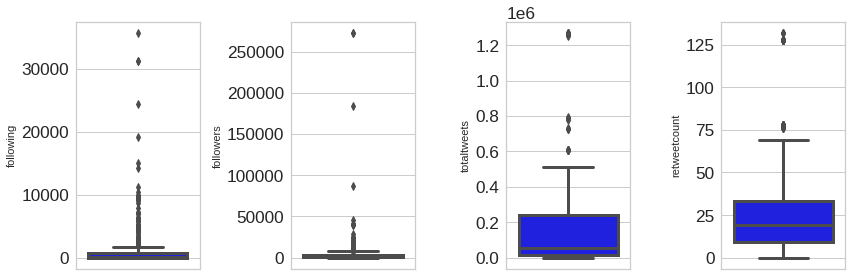

In [19]:
features = nub
for i in range(0, len(features)):
    plt.subplot(1, len(features), i + 1)
    sns.boxplot(y = data[features[i]], color = 'blue', orient = 'v')
    plt.tight_layout()

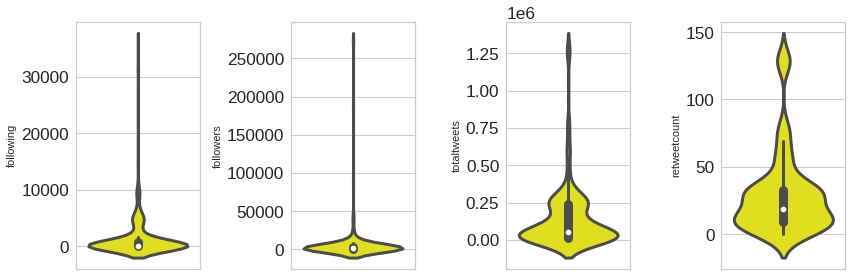

In [20]:
for i in range(0, len(nub)):
    plt.subplot(1, len(nub), i+1)
    sns.violinplot(y = data[nub[i]], color = 'yellow', orient = 'v')
    plt.tight_layout()

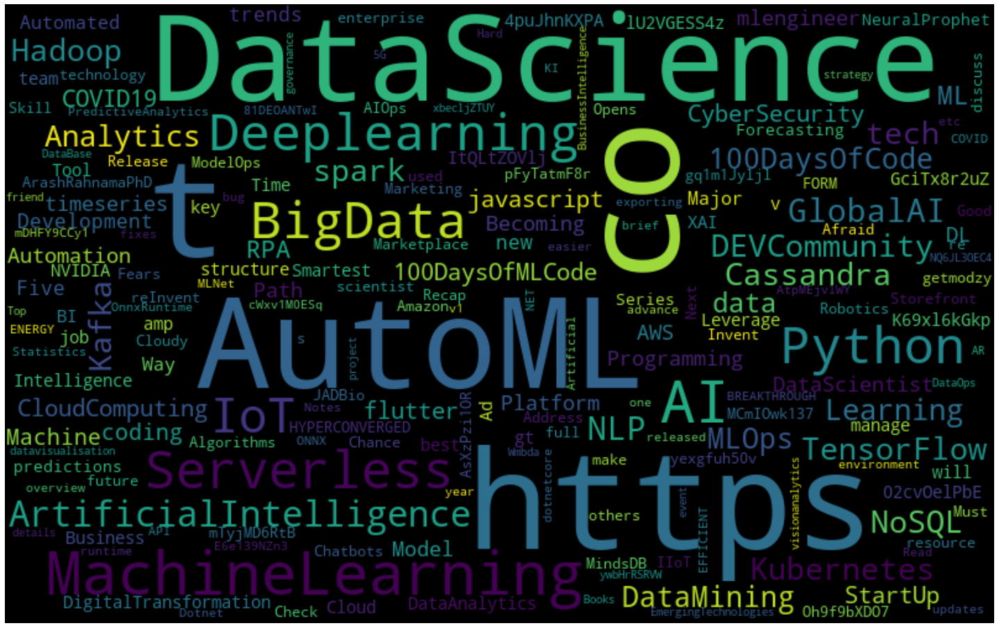

In [24]:
%matplotlib inline
from wordcloud import WordCloud

todos_palavras = ' '.join([texto for texto in data["text"]])
nuvem_palavras = WordCloud(width = 800, 
                           height = 500, 
                           max_font_size = 110,
                           collocations = False).generate(todos_palavras)

plt.figure(figsize= (25.5, 17))
plt.imshow(nuvem_palavras, interpolation = 'bilinear')
plt.axis('off')
plt.show()

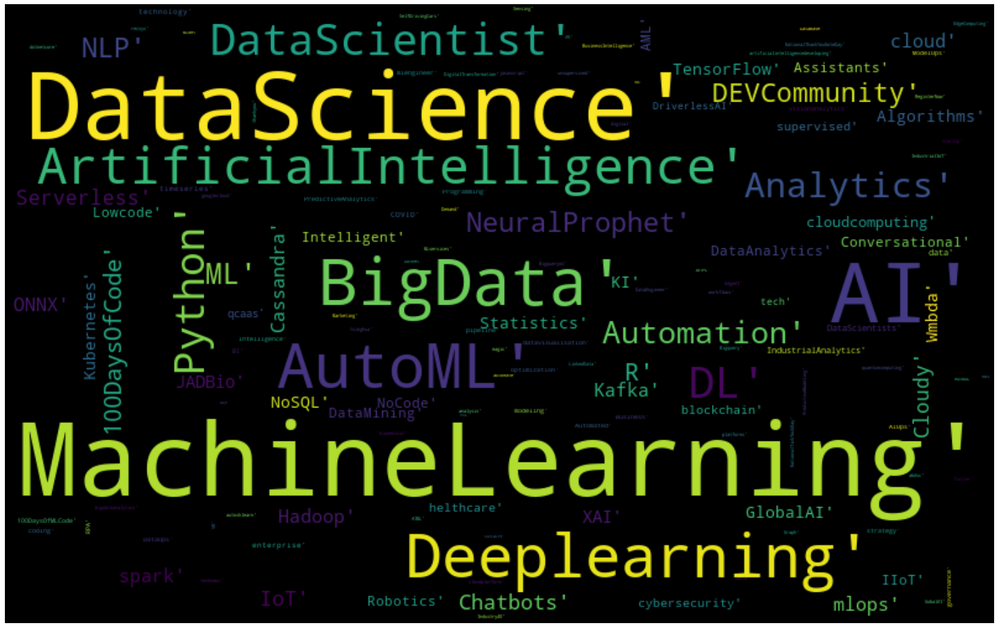

In [25]:
#hashtags

%matplotlib inline
from wordcloud import WordCloud

todos_palavras = ' '.join([texto for texto in data["hashtags"]])
nuvem_palavras = WordCloud(width = 800, 
                           height = 500, 
                           max_font_size = 110,
                           collocations = False).generate(todos_palavras)

plt.figure(figsize= (25.5, 17))
plt.imshow(nuvem_palavras, interpolation = 'bilinear')
plt.axis('off')
plt.show()

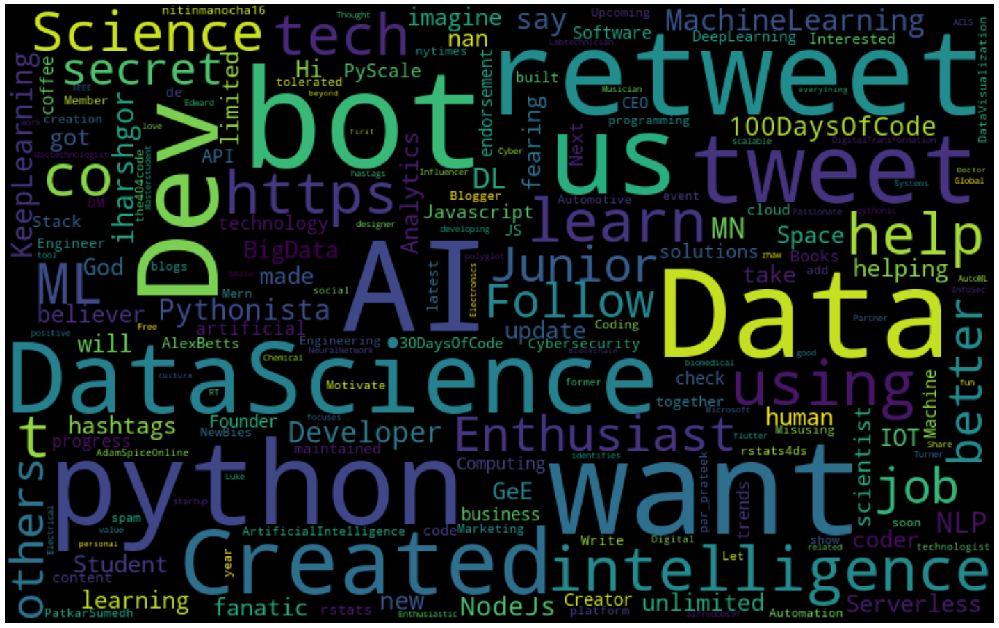

In [27]:
%matplotlib inline
from wordcloud import WordCloud

data['description'] = data['description'].astype(str)

todos_palavras = ' '.join([texto for texto in data["description"]])
nuvem_palavras = WordCloud(width = 800, 
                           height = 500, 
                           max_font_size = 110,
                           collocations = False).generate(todos_palavras)

plt.figure(figsize= (25.5, 17))
plt.imshow(nuvem_palavras, interpolation = 'bilinear')
plt.axis('off')
plt.show()

# Pré-processamento

In [28]:
# Bibliotecas sistema
import re
import unicodedata
import itertools

# Importando NLTK NLP
# Baixando pacote do nltk
import nltk
import string
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer

# Baixando todos os complementos NLTK
nltk.download('punkt')
nltk.download('stopwords')
wordnet_lemmatizer = WordNetLemmatizer()

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [29]:
# Mundando os tipo de dados de object para string 

data['text'] = data['text'].astype(str)
data['username'] = data['username'].astype(str)
data['location'] = data['location'].astype(str)

data['following'] = data['following'].astype(int)
data['followers'] = data['totaltweets'].astype(int)
data['retweetcount'] = data['retweetcount'].astype(int)

data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 553 entries, 0 to 552
Data columns (total 10 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Unnamed: 0    553 non-null    int64 
 1   username      553 non-null    object
 2   description   553 non-null    object
 3   location      553 non-null    object
 4   following     553 non-null    int64 
 5   followers     553 non-null    int64 
 6   totaltweets   553 non-null    int64 
 7   retweetcount  553 non-null    int64 
 8   text          553 non-null    object
 9   hashtags      553 non-null    object
dtypes: int64(5), object(5)
memory usage: 43.3+ KB


In [30]:
%%time

# Dados de limpeza para modelo PLN
# Variável para treino
x = data["text"]

# Lista de stopwords
list_stop_words = ['covfefe']

# Recebe uma lista de palavras ou texto como entrada e retorna um conjunto de palavras mais limpo. 
# A função faz normalização, codificação/decodificação, letras minúsculas e lematização.
def limpeza(texto):
    WNL = nltk.stem.WordNetLemmatizer()
    stop_words2 = nltk.corpus.stopwords.words("english") + stopwords
    texto = (unicodedata.normalize("NFKD", texto).encode("ascii", "ignore").decode("utf-8", "ignore").lower())
    WORDS = re.sub(r'[^\w\s]', '', texto).split()
    return [WNL.lemmatize(word) for word in WORDS if word not in stop_words2]

# Remove stop words: Removendo as stop words na base de dados
def remove_stop_words(instancia): # Removendo as stop words
    stopwords = set(nltk.corpus.stopwords.words("english"))
    palavras = [i for i in instancia.split() if not i in stopwords]
    return (" ".join(palavras))

# Palavras derivacionalmente relacionadas com significados semelhantes, palavras para retornar documentos que contenham outra palavra no conjunto.
def text_stemming(instancia):
    stemmer = nltk.stem.RSLPStemmer()
    palavras = []
    for w in instancia.split():
        palavras.append(stemmer.stem(w))
        return (" ".join(palavras))

# Limpeza na base de dados limpando dados de web com http e outros.
def dados_limpos(instancia): 
    instancia = re.sub(r"http\S+", "", instancia).lower().replace('.','').replace(';','').replace('-','').replace(':','').replace(')','')
    return (instancia)

#Lemmatization: Em linguística é o processo de agrupar as formas flexionadas de uma palavra para que possam ser analisadas como um único item, identificado pelo lema da palavra , ou forma de dicionário.
def Lemmatization(instancia):
    palavras = []
    for w in instancia.split():
        palavras.append(wordnet_lemmatizer.lemmatize(w))
        return (" ".join(palavras))

# Preprocessing: Pré - processamento da base de dados que serão ser para análise de dados.
def Preprocessing(instancia):
    instancia = re.sub(r"http\S+", "", instancia).lower().replace('.','').replace(';','').replace('-','').replace(':','')
    stopwords = set(nltk.corpus.stopwords.words('english'))
    palavras = [i for i in instancia.split() if not i in stopwords]
    return (" ".join(palavras))

# remover caracteres alphanuméricos
alphanumeric = lambda x: re.sub('\w*\d\w*', '', x)

# remover pontuações
punc = lambda x: re.sub('[%s]' % re.escape(string.punctuation), ' ', x)

# remover espaços duplos
remove_space = lambda x: x.replace('  ', ' ')

# Removendo pontuações descrições itens com expressão regular
data['text'] = data['text'].str.replace('[,.:;!?]+', ' ', regex=True).copy()

# Removendo os caracteres especiais de descrições 
data['text'] = data['text'].str.replace ('[/<>()|\+\-\$%&#@\'\"]+', ' ', regex=True).copy()

# Removendo palavras com números 
data['text'] = data['text'].str.replace('[0-9]+', '', regex=True).copy()

# Gerando a base dados limpo
x = [Preprocessing(i) for i in x]

# Aplicando nova coluna
data["text_clean"] = data["text"].apply(Preprocessing)

# Mundando os tipo de dados de object para string 
data["text_clean"] = data["text_clean"].astype(str)

# Salvando base textos
# Salvando arquivo em csv
data.to_csv("text_clean.csv", index=False)

# Salvando arquivo em text
data.to_csv("text_clean.text", index=False)

CPU times: user 170 ms, sys: 20.9 ms, total: 191 ms
Wall time: 193 ms


# Texto limpo

In [34]:
data.head(15)

,Unnamed: 0,username,description,location,following,followers,totaltweets,retweetcount,text,hashtags,text_clean
0,0,Discovertech3,Just a bot helping developers and designers by...,Internet,1,103083,103083,40,What is AutoML Automated Machine Learning ...,"['AutoML', 'MachineLearning', 'AI', 'KI', 'Alg...",automl automated machine learning brief overvi...
1,1,30xcodes,Retweets 🧲 #30DaysOfCode & #100DaysOfCode 🔥\nM...,nan,7,139465,139465,40,What is AutoML Automated Machine Learning ...,"['AutoML', 'MachineLearning', 'AI', 'KI', 'Alg...",automl automated machine learning brief overvi...
2,2,Fabriciosx,nan,Rio de janeiro,108,206589,206589,40,What is AutoML Automated Machine Learning ...,"['AutoML', 'MachineLearning', 'AI', 'KI', 'Alg...",automl automated machine learning brief overvi...
3,3,Women_who_code,24 🧬 ~ Javascript ❤️ ~ Mern Stack Developer ~ ...,bootcamp,23,247725,247725,40,What is AutoML Automated Machine Learning ...,"['AutoML', 'MachineLearning', 'AI', 'KI', 'Alg...",automl automated machine learning brief overvi...
4,4,xaelbot,"A bot, I like and retweet on #100DaysOfCode. B...",Earth,1,789185,789185,40,What is AutoML Automated Machine Learning ...,"['AutoML', 'MachineLearning', 'AI', 'KI', 'Alg...",automl automated machine learning brief overvi...
5,5,hubofml,"Once a month, you'll get a newsletter containi...",Germany,12,311423,311423,40,What is AutoML Automated Machine Learning ...,"['AutoML', 'MachineLearning', 'AI', 'KI', 'Alg...",automl automated machine learning brief overvi...
6,6,CodeGnuts,Just a bot helping coders show their progress....,nan,0,606195,606195,40,What is AutoML Automated Machine Learning ...,"['AutoML', 'MachineLearning', 'AI', 'KI', 'Alg...",automl automated machine learning brief overvi...
7,7,AISOMA_AG,#AIConsulting #AIStrategy #AISOMA #TechnologyS...,"Frankfurt am Main, Hessen",1787,1468,1468,40,What is AutoML Automated Machine Learning ...,"['AutoML', 'MachineLearning', 'AI', 'KI', 'Alg...",automl automated machine learning brief overvi...
8,8,hubofml,"Once a month, you'll get a newsletter containi...",Germany,12,311423,311423,69,Future Trends in DataAnalytics amp AI\n\n...,"['DataAnalytics', 'AI', 'Analytics', 'XAI', 'A...",future trends dataanalytics amp ai analytics x...
9,9,CodeGnuts,Just a bot helping coders show their progress....,nan,0,606195,606195,69,Future Trends in DataAnalytics amp AI\n\n...,"['DataAnalytics', 'AI', 'Analytics', 'XAI', 'A...",future trends dataanalytics amp ai analytics x...


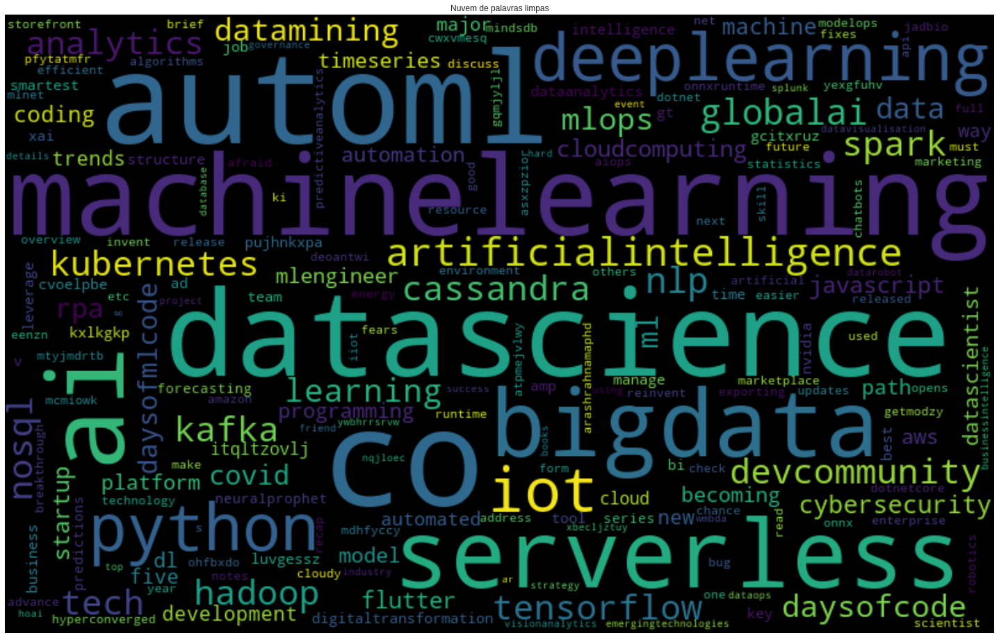

In [33]:
todos_palavras = ' '.join([texto for texto in data["text_clean"]])
nuvem_palavras = WordCloud(width = 800, 
                           height = 500, 
                           max_font_size = 110,
                           collocations = False).generate(todos_palavras)

plt.figure(figsize= (25.5, 17))
plt.title("Nuvem de palavras limpas")
plt.imshow(nuvem_palavras, interpolation = 'bilinear')
plt.axis('off')
plt.show()

# Modelo nlp - Pré treinado spacy

In [35]:
import spacy
nlp = spacy.load('en_core_web_sm')

In [36]:
from pycaret.nlp import *

model = setup(data = data, 
                   target = 'text_clean', 
                   session_id = 123)

Description,Value
session_id,123
Documents,553
Vocab Size,453
Custom Stopwords,False


INFO:logs:setup() succesfully completed......................................


In [37]:
lda = create_model('lda')
print(lda)

INFO:logs:LdaModel(num_terms=453, num_topics=4, decay=0.5, chunksize=100)
INFO:logs:create_model() succesfully completed......................................


LdaModel(num_terms=453, num_topics=4, decay=0.5, chunksize=100)


In [38]:
lda2 = create_model('lda', 
                    num_topics = 10, 
                    multi_core = True)
print(lda2)

INFO:logs:LdaModel(num_terms=453, num_topics=10, decay=0.5, chunksize=100)
INFO:logs:create_model() succesfully completed......................................


LdaModel(num_terms=453, num_topics=10, decay=0.5, chunksize=100)


In [39]:
lda_results = assign_model(lda)
lda_results.head()

INFO:logs:(553, 17)
INFO:logs:assign_model() succesfully completed......................................


,Unnamed: 0,username,description,location,following,followers,totaltweets,retweetcount,text,hashtags,text_clean,Topic_0,Topic_1,Topic_2,Topic_3,Dominant_Topic,Perc_Dominant_Topic
0,0,Discovertech3,Just a bot helping developers and designers by...,Internet,1,103083,103083,40,What is AutoML Automated Machine Learning ...,"['AutoML', 'MachineLearning', 'AI', 'KI', 'Alg...",automate machine learning brief overview ai,0.023423,0.008043,0.946408,0.022126,Topic 2,0.95
1,1,30xcodes,Retweets 🧲 #30DaysOfCode & #100DaysOfCode 🔥\nM...,nan,7,139465,139465,40,What is AutoML Automated Machine Learning ...,"['AutoML', 'MachineLearning', 'AI', 'KI', 'Alg...",automate machine learning brief overview ai,0.023423,0.008043,0.946408,0.022126,Topic 2,0.95
2,2,Fabriciosx,nan,Rio de janeiro,108,206589,206589,40,What is AutoML Automated Machine Learning ...,"['AutoML', 'MachineLearning', 'AI', 'KI', 'Alg...",automate machine learning brief overview ai,0.023423,0.008043,0.946408,0.022126,Topic 2,0.95
3,3,Women_who_code,24 🧬 ~ Javascript ❤️ ~ Mern Stack Developer ~ ...,bootcamp,23,247725,247725,40,What is AutoML Automated Machine Learning ...,"['AutoML', 'MachineLearning', 'AI', 'KI', 'Alg...",automate machine learning brief overview ai,0.023423,0.008043,0.946408,0.022126,Topic 2,0.95
4,4,xaelbot,"A bot, I like and retweet on #100DaysOfCode. B...",Earth,1,789185,789185,40,What is AutoML Automated Machine Learning ...,"['AutoML', 'MachineLearning', 'AI', 'KI', 'Alg...",automate machine learning brief overview ai,0.023423,0.008043,0.946408,0.022126,Topic 2,0.95


In [40]:
plot_model()

INFO:logs:Initializing plot_model()
INFO:logs:plot_model(model=None, plot=frequency, topic_num=None, save=False, system=True)
INFO:logs:Checking exceptions
INFO:logs:Importing libraries


INFO:logs:save_param set to False
INFO:logs:plot type: frequency
INFO:logs:Rendering Visual
INFO:logs:Fitting CountVectorizer()


INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [41]:
plot_model(lda, plot = 'frequency')

INFO:logs:Initializing plot_model()
INFO:logs:plot_model(model=LdaModel(num_terms=453, num_topics=4, decay=0.5, chunksize=100), plot=frequency, topic_num=None, save=False, system=True)
INFO:logs:Topic selected. topic_num : Topic 0
INFO:logs:Checking exceptions
INFO:logs:Importing libraries


INFO:logs:save_param set to False
INFO:logs:plot type: frequency
INFO:logs:Rendering Visual
INFO:logs:SubProcess assign_model() called ==================================
INFO:logs:Initializing assign_model()
INFO:logs:assign_model(model=LdaModel(num_terms=453, num_topics=4, decay=0.5, chunksize=100), verbose=False)
INFO:logs:Determining model type
INFO:logs:model type: lda
INFO:logs:Checking exceptions
INFO:logs:Preloading libraries
INFO:logs:Preparing display monitor
INFO:logs:(553, 17)
INFO:logs:assign_model() succesfully completed......................................
INFO:logs:SubProcess assign_model() end ==================================
INFO:logs:Fitting CountVectorizer()


INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [42]:
plot_model(lda, plot = 'topic_distribution')

INFO:logs:Initializing plot_model()
INFO:logs:plot_model(model=LdaModel(num_terms=453, num_topics=4, decay=0.5, chunksize=100), plot=topic_distribution, topic_num=None, save=False, system=True)
INFO:logs:Topic selected. topic_num : Topic 0
INFO:logs:Checking exceptions
INFO:logs:Importing libraries


INFO:logs:save_param set to False
INFO:logs:plot type: topic_distribution
INFO:logs:SubProcess assign_model() called ==================================
INFO:logs:Initializing assign_model()
INFO:logs:assign_model(model=LdaModel(num_terms=453, num_topics=4, decay=0.5, chunksize=100), verbose=False)
INFO:logs:Determining model type
INFO:logs:model type: lda
INFO:logs:Checking exceptions
INFO:logs:Preloading libraries
INFO:logs:Preparing display monitor
INFO:logs:(553, 17)
INFO:logs:assign_model() succesfully completed......................................
INFO:logs:SubProcess assign_model() end ==================================
INFO:logs:Sorting Dataframe
INFO:logs:Rendering Visual


INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [43]:
plot_model(lda, plot = 'topic_model')

INFO:logs:Initializing plot_model()
INFO:logs:plot_model(model=LdaModel(num_terms=453, num_topics=4, decay=0.5, chunksize=100), plot=topic_model, topic_num=None, save=False, system=True)
INFO:logs:Topic selected. topic_num : Topic 0
INFO:logs:Checking exceptions
INFO:logs:Importing libraries


INFO:logs:save_param set to False
INFO:logs:plot type: topic_model
INFO:logs:Preparing pyLDAvis visual


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
3      0.273818  0.107918       1        1  37.701693
0      0.123193 -0.256534       2        1  33.854600
1     -0.249501 -0.124515       3        1  15.885686
2     -0.147510  0.273131       4        1  12.558021, topic_info=              Term        Freq       Total Category  logprob  loglift
13     datascience  209.000000  209.000000  Default  30.0000  30.0000
4          machine   72.000000   72.000000  Default  29.0000  29.0000
19      deeplearne  301.000000  301.000000  Default  28.0000  28.0000
21   machinelearne  291.000000  291.000000  Default  27.0000  27.0000
11            mlop  135.000000  135.000000  Default  26.0000  26.0000
..             ...         ...         ...      ...      ...      ...
44    intelligence   16.289330   29.470910   Topic4  -3.8788   1.4819
136         become   15.574179   71.581770   Topic4  -3.9237   0.5496
6               co   29.815035  356.442171   Topic4  -3.2743  -0.4063
0               ai   23.376247  212.498444   Topic4  -3.5176  -0.1324
55             new    9.596561   91.404467   Topic4  -4.4080  -0.1791

[190 rows x 6 columns], token_table=      Topic      Freq     Term
term                          
130       3  0.919926       ad
107       3  0.871411  address
83        1  0.871429  advance
0         1  0.588240       ai
0         2  0.235296       ai
...     ...       ...      ...
52        2  0.974653    trend
258       4  0.897130   update
58        2  0.968321      use
110       3  0.892883      way
273       4  0.962596     wire

[172 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[4, 1, 2, 3])

INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [44]:
plot_model(plot = 'bigram')

INFO:logs:Initializing plot_model()
INFO:logs:plot_model(model=None, plot=bigram, topic_num=None, save=False, system=True)
INFO:logs:Checking exceptions
INFO:logs:Importing libraries


INFO:logs:save_param set to False
INFO:logs:plot type: bigram
INFO:logs:Fitting CountVectorizer()
INFO:logs:Rendering Visual


INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [45]:
plot_model(lda, plot = 'frequency', topic_num = 'Topic 1')

INFO:logs:Initializing plot_model()
INFO:logs:plot_model(model=LdaModel(num_terms=453, num_topics=4, decay=0.5, chunksize=100), plot=frequency, topic_num=Topic 1, save=False, system=True)
INFO:logs:Checking exceptions
INFO:logs:Importing libraries


INFO:logs:save_param set to False
INFO:logs:plot type: frequency
INFO:logs:Rendering Visual
INFO:logs:SubProcess assign_model() called ==================================
INFO:logs:Initializing assign_model()
INFO:logs:assign_model(model=LdaModel(num_terms=453, num_topics=4, decay=0.5, chunksize=100), verbose=False)
INFO:logs:Determining model type
INFO:logs:model type: lda
INFO:logs:Checking exceptions
INFO:logs:Preloading libraries
INFO:logs:Preparing display monitor
INFO:logs:(553, 17)
INFO:logs:assign_model() succesfully completed......................................
INFO:logs:SubProcess assign_model() end ==================================
INFO:logs:Fitting CountVectorizer()


INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [46]:
plot_model(lda, plot = 'topic_distribution')

INFO:logs:Initializing plot_model()
INFO:logs:plot_model(model=LdaModel(num_terms=453, num_topics=4, decay=0.5, chunksize=100), plot=topic_distribution, topic_num=None, save=False, system=True)
INFO:logs:Topic selected. topic_num : Topic 0
INFO:logs:Checking exceptions
INFO:logs:Importing libraries


INFO:logs:save_param set to False
INFO:logs:plot type: topic_distribution
INFO:logs:SubProcess assign_model() called ==================================
INFO:logs:Initializing assign_model()
INFO:logs:assign_model(model=LdaModel(num_terms=453, num_topics=4, decay=0.5, chunksize=100), verbose=False)
INFO:logs:Determining model type
INFO:logs:model type: lda
INFO:logs:Checking exceptions
INFO:logs:Preloading libraries
INFO:logs:Preparing display monitor
INFO:logs:(553, 17)
INFO:logs:assign_model() succesfully completed......................................
INFO:logs:SubProcess assign_model() end ==================================
INFO:logs:Sorting Dataframe
INFO:logs:Rendering Visual


INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [47]:
evaluate_model(lda)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Frequency Plot', 'freque…

In [48]:
evaluate_model(lda)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Frequency Plot', 'freque…

In [49]:
evaluate_model(lda)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Frequency Plot', 'freque…

In [53]:
evaluate_model(lda) 

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Frequency Plot', 'freque…

# Modelo 2 Automl

In [54]:
stopwords = ['co','http','go','get']
setup(data, 
      target = 'description',
      session_id = 123, 
      custom_stopwords = stopwords)

Description,Value
session_id,123
Documents,553
Vocab Size,702
Custom Stopwords,True


INFO:logs:setup() succesfully completed......................................


([['help', 'developer', 'designer', 'retweete', 'creation', 'make'],
  ['retweet', 'follow'],
  [],
  ['developer', 'book', 'coffee'],
  ['block', 'want', 'retweete', 'create'],
  ['month',
   'newsletter',
   'contain',
   'exciting',
   'stuff',
   'science',
   'software',
   'engineering',
   'leadership',
   'subscribe'],
  ['help', 'coder', 'show', 'progress', 'adamspiceonline', 'daysofcode'],
  ['aiconsulte', 'machinelearne'],
  ['month',
   'newsletter',
   'contain',
   'exciting',
   'stuff',
   'science',
   'software',
   'engineering',
   'leadership',
   'subscribe'],
  ['help', 'coder', 'show', 'progress', 'adamspiceonline', 'daysofcode'],
  ['aiconsulte', 'machinelearne'],
  [],
  ['limited', 'intelligence', 'intelligence', 'take', 'believer'],
  ['machinelearne', 'deeplearne', 'analytic', 'datamine', 'datascience'],
  ['instructor', 'humanity', 'yet', 'lose'],
  ['interested', 'use', 'retweet', 'endorsement', 'check', 'bot'],
  ['create', 'use', 'say'],
  ['datascience

In [55]:
lda2 = create_model('lda')

INFO:logs:LdaModel(num_terms=702, num_topics=4, decay=0.5, chunksize=100)
INFO:logs:create_model() succesfully completed......................................


In [56]:
plot_model(lda2, plot = 'topic_distribution')

INFO:logs:Initializing plot_model()
INFO:logs:plot_model(model=LdaModel(num_terms=702, num_topics=4, decay=0.5, chunksize=100), plot=topic_distribution, topic_num=None, save=False, system=True)
INFO:logs:Topic selected. topic_num : Topic 0
INFO:logs:Checking exceptions
INFO:logs:Importing libraries


INFO:logs:save_param set to False
INFO:logs:plot type: topic_distribution
INFO:logs:SubProcess assign_model() called ==================================
INFO:logs:Initializing assign_model()
INFO:logs:assign_model(model=LdaModel(num_terms=702, num_topics=4, decay=0.5, chunksize=100), verbose=False)
INFO:logs:Determining model type
INFO:logs:model type: lda
INFO:logs:Checking exceptions
INFO:logs:Preloading libraries
INFO:logs:Preparing display monitor
INFO:logs:(553, 17)
INFO:logs:assign_model() succesfully completed......................................
INFO:logs:SubProcess assign_model() end ==================================
INFO:logs:Sorting Dataframe
INFO:logs:Rendering Visual


INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [57]:
df2 = assign_model(lda2)
df2

INFO:logs:(553, 17)
INFO:logs:assign_model() succesfully completed......................................


,Unnamed: 0,username,description,location,following,followers,totaltweets,retweetcount,text,hashtags,text_clean,Topic_0,Topic_1,Topic_2,Topic_3,Dominant_Topic,Perc_Dominant_Topic
0,0,Discovertech3,help developer designer retweete creation make,Internet,1,103083,103083,40,What is AutoML Automated Machine Learning ...,"['AutoML', 'MachineLearning', 'AI', 'KI', 'Alg...",automl automated machine learning brief overvi...,0.807910,0.169879,0.010602,0.011608,Topic 0,0.81
1,1,30xcodes,retweet follow,nan,7,139465,139465,40,What is AutoML Automated Machine Learning ...,"['AutoML', 'MachineLearning', 'AI', 'KI', 'Alg...",automl automated machine learning brief overvi...,0.054277,0.464410,0.449943,0.031371,Topic 1,0.46
2,2,Fabriciosx,,Rio de janeiro,108,206589,206589,40,What is AutoML Automated Machine Learning ...,"['AutoML', 'MachineLearning', 'AI', 'KI', 'Alg...",automl automated machine learning brief overvi...,0.364812,0.231752,0.192581,0.210855,Topic 0,0.36
3,3,Women_who_code,developer book coffee,bootcamp,23,247725,247725,40,What is AutoML Automated Machine Learning ...,"['AutoML', 'MachineLearning', 'AI', 'KI', 'Alg...",automl automated machine learning brief overvi...,0.038086,0.024186,0.020098,0.917630,Topic 3,0.92
4,4,xaelbot,block want retweete create,Earth,1,789185,789185,40,What is AutoML Automated Machine Learning ...,"['AutoML', 'MachineLearning', 'AI', 'KI', 'Alg...",automl automated machine learning brief overvi...,0.948951,0.018626,0.015477,0.016946,Topic 0,0.95
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
548,548,epuujee,datum science enthusiast keeplearne,Mongolia,298,241121,241121,35,How to structure and manage a datascience tea...,"['datascience', 'Machinelearning', 'Deeplearni...",structure manage datascience team co luvgessz ...,0.948951,0.018626,0.015477,0.016946,Topic 0,0.95
549,549,iPythonistaBot,create use say,nan,1,54832,54832,35,How to structure and manage a datascience tea...,"['datascience', 'Machinelearning', 'Deeplearni...",structure manage datascience team co luvgessz ...,0.933711,0.024186,0.020098,0.022005,Topic 0,0.93
550,550,thomashilbig2,literally automate version tomhilbig bigdata m...,nan,1,104485,104485,35,How to structure and manage a datascience tea...,"['datascience', 'Machinelearning', 'Deeplearni...",structure manage datascience team co luvgessz ...,0.965030,0.012759,0.010602,0.011608,Topic 0,0.97
551,551,Discovertech3,help developer designer retweete creation make,Internet,1,106190,106190,40,What is AutoML Automated Machine Learning ...,"['AutoML', 'MachineLearning', 'AI', 'KI', 'Alg...",automl automated machine learning brief overvi...,0.807910,0.169879,0.010602,0.011608,Topic 0,0.81


In [59]:
exp_nlp102 = setup(data = data, 
                   target = 'text_clean', 
                   session_id = 123,
                   custom_stopwords = ['loan', 'income', 'usd', 'many', 'also', 'make', 'business', 'buy', 
                                       'sell', 'purchase','year', 'people', 'able', 'enable', 'old', 'woman',
                                       'child', 'school'],
                   log_experiment = True)

Description,Value
session_id,123
Documents,553
Vocab Size,449
Custom Stopwords,True


INFO:logs:setup() succesfully completed......................................


In [60]:
lda = create_model('lda')
lda

INFO:logs:LdaModel(num_terms=449, num_topics=4, decay=0.5, chunksize=100)
INFO:logs:create_model() succesfully completed......................................


In [61]:
plot_model(lda, plot = 'topic_distribution')

INFO:logs:Initializing plot_model()
INFO:logs:plot_model(model=LdaModel(num_terms=449, num_topics=4, decay=0.5, chunksize=100), plot=topic_distribution, topic_num=None, save=False, system=True)
INFO:logs:Topic selected. topic_num : Topic 0
INFO:logs:Checking exceptions
INFO:logs:Importing libraries


INFO:logs:save_param set to False
INFO:logs:plot type: topic_distribution
INFO:logs:SubProcess assign_model() called ==================================
INFO:logs:Initializing assign_model()
INFO:logs:assign_model(model=LdaModel(num_terms=449, num_topics=4, decay=0.5, chunksize=100), verbose=False)
INFO:logs:Determining model type
INFO:logs:model type: lda
INFO:logs:Checking exceptions
INFO:logs:Preloading libraries
INFO:logs:Preparing display monitor
INFO:logs:(553, 17)
INFO:logs:assign_model() succesfully completed......................................
INFO:logs:SubProcess assign_model() end ==================================
INFO:logs:Sorting Dataframe
INFO:logs:Rendering Visual


INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [62]:
tuned_unsupervised = tune_model(model = 'lda', multi_core = True)

INFO:logs:Initializing tune_model()
INFO:logs:tune_model(model=lda, multi_core=True, supervised_target=None, estimator=None, optimize=None, custom_grid=None, auto_fe=True, fold=10, verbose=True)
INFO:logs:Checking exceptions
INFO:logs:Preloading libraries
INFO:logs:Preparing display monitor


IntProgress(value=0, description='Processing: ', max=25)

Output()

INFO:logs:Importing libraries


INFO:logs:Objective : Unsupervised
INFO:logs:Defining model name
INFO:logs:Topic Model Name: Latent Dirichlet Allocation
INFO:logs:Defining supervised estimator
INFO:logs:Estimator: None
INFO:logs:Defining Optimizer
INFO:logs:Optimize: None
INFO:logs:Defining Tuning Grid
INFO:logs:Pre-defined Grid used


,,
,,
Initiated,. . . . . . . . . . . . . . . . . .,19:51:19
Status,. . . . . . . . . . . . . . . . . .,Finalizing
Step,. . . . . . . . . . . . . . . . . .,Evaluating Coherence With 400 Topics


INFO:logs:Fitting Model with num_topics = 2
INFO:logs:SubProcess create_model() called ==================================
INFO:logs:Initializing create_model()
INFO:logs:create_model(model=lda, multi_core=True, num_topics=2, verbose=False, system=True)
INFO:logs:Checking exceptions
INFO:logs:Preloading libraries
INFO:logs:Preparing display monitor
INFO:logs:Defining topic model
INFO:logs:Model: Latent Dirichlet Allocation
INFO:logs:Defining num_topics parameter
INFO:logs:num_topics set to: 2
INFO:logs:LDA multi_core enabled
INFO:logs:LdaMulticore imported successfully
INFO:logs:LdaMulticore trained successfully
INFO:logs:Creating Dashboard Logs
INFO:logs:LdaModel(num_terms=449, num_topics=2, decay=0.5, chunksize=100)
INFO:logs:create_model() succesfully completed......................................
INFO:logs:SubProcess create_model() end ==================================
INFO:logs:SubProcess assign_model() called ==================================
INFO:logs:Initializing assign_model

INFO:logs:Visual Rendered Successfully
INFO:logs:LdaModel(num_terms=449, num_topics=32, decay=0.5, chunksize=100)
INFO:logs:tune_model() succesfully completed......................................


Best Model: Latent Dirichlet Allocation | # Topics: 32 | Coherence: 0.3986


In [63]:
save_model(lda,'Final LDA Model 08Feb2020')

INFO:logs:Initializing save_model()
INFO:logs:save_model(model=LdaModel(num_terms=449, num_topics=4, decay=0.5, chunksize=100), model_name=Final LDA Model 08Feb2020, verbose=True)
INFO:logs:LdaModel(num_terms=449, num_topics=4, decay=0.5, chunksize=100)
INFO:logs:save_model() succesfully completed......................................


Model Succesfully Saved


(<gensim.models.ldamodel.LdaModel at 0x7f52647bf130>,
 'Final LDA Model 08Feb2020.pkl')

In [64]:
saved_lda = load_model('Final LDA Model 08Feb2020')
print(saved_lda)

Model Sucessfully Loaded
LdaModel(num_terms=449, num_topics=4, decay=0.5, chunksize=100)
